In [1]:
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_recall_curve, precision_score

from torchvision import models
from torch.optim.lr_scheduler import StepLR, ExponentialLR
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Resize, ToTensor, Compose
from PIL import ImageFile

import torch.hub
import torch.nn as nn

import torch, torchvision
import torch.nn as nn
from torch.optim.lr_scheduler import StepLR, ExponentialLR
import torch
from torch import nn as nn
from torchvision.datasets import ImageFolder

from tqdm import tqdm
ImageFile.LOAD_TRUNCATED_IMAGES = True

device = "mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu"

In [2]:
MobileNet= torch.hub.load('pytorch/vision', 'mobilenet_v3_small', pretrained=True)
MobileNet.classifier

Using cache found in /Users/shadyali/.cache/torch/hub/pytorch_vision_main
/Users/shadyali/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/shadyali/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V3_Small_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V3_Small_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential(
  (0): Linear(in_features=576, out_features=1024, bias=True)
  (1): Hardswish()
  (2): Dropout(p=0.2, inplace=True)
  (3): Linear(in_features=1024, out_features=1000, bias=True)
)

In [97]:
class HelpNet(nn.Module):
    def __init__(self):
        super(HelpNet, self).__init__()
        
        self.backbone = torchvision.models.mobilenet_v3_small(weights = 'DEFAULT', progress = True)
        self.backbone.classifier = nn.Sequential(
            nn.Linear(576, 1220),
            nn.Hardswish(inplace=True),
            nn.Dropout(p=0.2, inplace=True),
            nn.Linear(1220, 512),
            nn.Hardswish(inplace = True),
            nn.Linear(512, 128),
            nn.Hardswish(inplace = True),
            nn.Linear(128, 64),
            nn.Hardswish(inplace = True),
            nn.Linear(64, 2)
            )
        
    def forward(self, x):
        return self.backbone(x)

helpNet = HelpNet().to(device)

In [98]:
learningRate = 0.001

lossFunction = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(helpNet.parameters(), lr = learningRate)


# Create the scheduler with a step size of 10 and gamma of 0.1
# scheduler = StepLR(optimizer, step_size=1, gamma=0.1)

# Alternative: Use exponential decay
scheduler = ExponentialLR(optimizer, gamma=0.95)

In [95]:
import torch
from torchvision import models
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize, RandomHorizontalFlip
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader


# To load truncated images
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

mobileNetTransformations = Compose([
    Resize(256),
    CenterCrop(224),
    # RandomHorizontalFlip(p = 0.2),
    ToTensor(),
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

dataset = ImageFolder(root='/Users/shadyali/HelpNet/P2datasetFull/val1', transform = mobileNetTransformations)

dataIterator = iter(DataLoader(dataset, batch_size = 48, shuffle=True, num_workers=0))

In [96]:
# One Batch ovefit

epochs = 20
totalBatches = len(dataIterator)

helpNet.train()

TrainingbatchLoss = []
TrainingEpochLoss = []

dataIterator = next(iter(DataLoader(dataset, batch_size = 8, shuffle=True, num_workers=0)))
for epoch in range(epochs):
    
    
    info = {}
    
    batch, (images, labels) =  1, dataIterator
    images, labels = images.to(device), labels.to(device)

    # Forward pass
    y = helpNet(images)
    loss = lossFunction(y, labels)
    
    
    # Reset the gradients
    optimizer.zero_grad()
    
    
    # Backward pass
    loss.backward()
    
    
    # Update Gradients and Learning Rate
    optimizer.step()
    # scheduler.step()
    
    
    # Store batch loss
    TrainingbatchLoss.append(loss.item())
    
    
    # Print updates
    yTrue = labels.detach().cpu()
    _, yPrediction = torch.max(y.detach().cpu(), dim = 1)
    info = {'Loss': f'{loss.item(): .3f}', 'Batch': f'{batch + 1}/{totalBatches}',
            'Epoch': f'{epoch + 1}/{epochs}', 'Acc': f'{accuracy_score(y_true = yTrue, y_pred = yPrediction): .3f}',
            'Right': f'{torch.sum(yTrue == yPrediction)}'}
#     batches.set_postfix(info)
            
    TrainingEpochLoss.append(info['Loss'])
    print(f'{info}\n')
        


{'Loss': ' 0.687', 'Batch': '2/130', 'Epoch': '1/20', 'Acc': ' 0.625', 'Right': '5'}

{'Loss': ' 0.664', 'Batch': '2/130', 'Epoch': '2/20', 'Acc': ' 0.625', 'Right': '5'}

{'Loss': ' 0.582', 'Batch': '2/130', 'Epoch': '3/20', 'Acc': ' 1.000', 'Right': '8'}

{'Loss': ' 0.394', 'Batch': '2/130', 'Epoch': '4/20', 'Acc': ' 1.000', 'Right': '8'}

{'Loss': ' 0.162', 'Batch': '2/130', 'Epoch': '5/20', 'Acc': ' 1.000', 'Right': '8'}

{'Loss': ' 0.039', 'Batch': '2/130', 'Epoch': '6/20', 'Acc': ' 1.000', 'Right': '8'}

{'Loss': ' 0.003', 'Batch': '2/130', 'Epoch': '7/20', 'Acc': ' 1.000', 'Right': '8'}

{'Loss': ' 0.000', 'Batch': '2/130', 'Epoch': '8/20', 'Acc': ' 1.000', 'Right': '8'}

{'Loss': ' 0.000', 'Batch': '2/130', 'Epoch': '9/20', 'Acc': ' 1.000', 'Right': '8'}

{'Loss': ' 0.000', 'Batch': '2/130', 'Epoch': '10/20', 'Acc': ' 1.000', 'Right': '8'}

{'Loss': ' 0.000', 'Batch': '2/130', 'Epoch': '11/20', 'Acc': ' 1.000', 'Right': '8'}

{'Loss': ' 0.000', 'Batch': '2/130', 'Epoch': '12/20

In [99]:
epochs = 6
totalBatches = len(dataIterator)

helpNet.train()

TrainingbatchLoss = []
TrainingEpochLoss = []

for epoch in range(epochs):
    dataIterator = iter(DataLoader(dataset, batch_size = 48, shuffle=True, num_workers=0))
    
    info = {}
    with tqdm(enumerate(dataIterator), total = len(dataIterator), desc = "Training", unit = "Batch") as batches:
        for batch, (images, labels) in batches:
            images, labels = images.to(device), labels.to(device)

            # Forward pass
            y = helpNet(images)
            loss = lossFunction(y, labels)
            
            
            # Reset the gradients
            optimizer.zero_grad()
            
            
            # Backward pass
            loss.backward()
            
            
            # Update Gradients and Learning Rate
            optimizer.step()
            # scheduler.step()
            
            
            # Store batch loss
            TrainingbatchLoss.append(loss.item())
            
            
            # Print updates
            yTrue = labels.detach().cpu()
            _, yPrediction = torch.max(y.detach().cpu(), dim = 1)
            info = {'Loss': f'{loss.item(): .3f}', 'Batch': f'{batch + 1}/{totalBatches}',
                    'Epoch': f'{epoch + 1}/{epochs}', 'Acc': f'{accuracy_score(y_true = yTrue, y_pred = yPrediction): .3f}',
                    'Right': f'{torch.sum(yTrue == yPrediction)}'}
            batches.set_postfix(info)
            
    TrainingEpochLoss.append(info['Loss'])
    print(f'\n')
        


Training: 100%|██████████| 130/130 [01:05<00:00,  1.99Batch/s, Loss=0.160, Batch=130/2, Epoch=1/6, Acc=0.966, Right=28]


Training: 100%|██████████| 130/130 [01:14<00:00,  1.75Batch/s, Loss=0.019, Batch=130/2, Epoch=2/6, Acc=1.000, Right=29]


Training: 100%|██████████| 130/130 [01:15<00:00,  1.72Batch/s, Loss=0.025, Batch=130/2, Epoch=3/6, Acc=1.000, Right=29]


Training: 100%|██████████| 130/130 [01:20<00:00,  1.62Batch/s, Loss=0.030, Batch=130/2, Epoch=4/6, Acc=1.000, Right=29]


Training: 100%|██████████| 130/130 [01:18<00:00,  1.66Batch/s, Loss=0.024, Batch=130/2, Epoch=5/6, Acc=1.000, Right=29]


Training: 100%|██████████| 130/130 [01:22<00:00,  1.57Batch/s, Loss=0.037, Batch=130/2, Epoch=6/6, Acc=0.966, Right=28]

In [113]:
TrainingEpochLoss

[' 0.160', ' 0.019', ' 0.025', ' 0.030', ' 0.024', ' 0.037']

In [109]:
import matplotlib.pyplot as plt

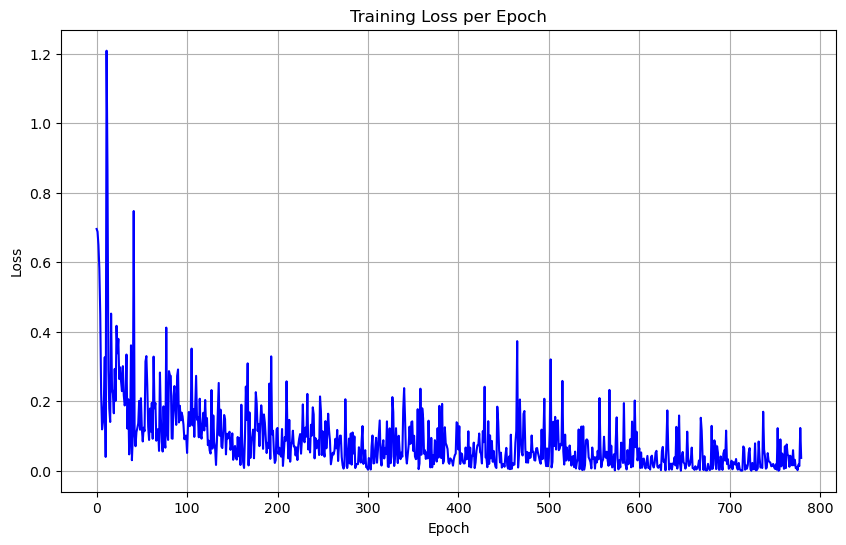

In [115]:
plt.figure(figsize=(10, 6))
plt.plot(TrainingbatchLoss, 'b-',)
plt.title('Training Loss per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.show()

In [23]:
# Create a data loader to load all images
full_loader = DataLoader(dataset, batch_size=len(dataset), shuffle=True, num_workers=0)

# Get all images in a single batch
all_images, all_labels = next(iter(full_loader))

print(f"Total number of images: {len(dataset)}")
print(f"Images tensor shape: {all_images.shape}")
print(f"Labels tensor shape: {all_labels.shape}")

Total number of images: 6221
Images tensor shape: torch.Size([6221, 3, 224, 224])
Labels tensor shape: torch.Size([6221])


In [29]:
with torch.no_grad():
    _, predictions = torch.max(helpNet(all_images[333:444].to(device)).cpu(), dim = 1)
    
    acc = accuracy_score(y_true = all_labels[333:444].cpu(), y_pred = predictions.cpu())
    print(acc)

1.0


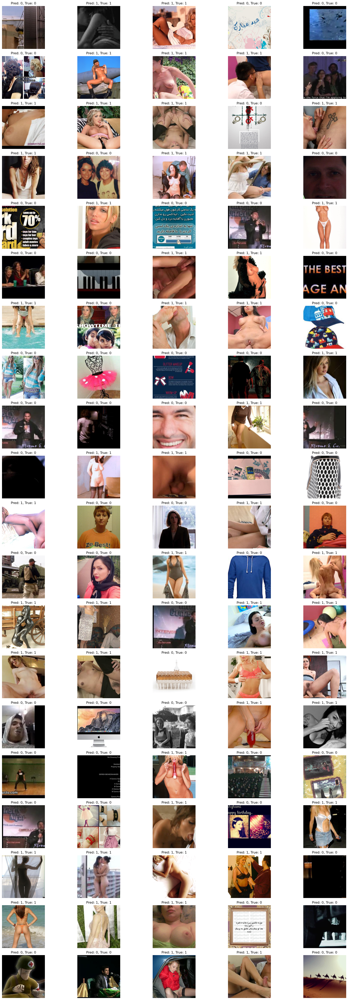

In [30]:
import matplotlib.pyplot as plt

with torch.no_grad():
    _, predictions = torch.max(helpNet(all_images[:100].to(device)), dim = 1)
    
    # Create a figure with multiple subplots
    plt.figure(figsize=(20, 50))
    for i in range(min(100, len(all_images))):
        plt.subplot(20, 5, i + 1)
        # Get the image tensor and move to CPU
        img = all_images[i].cpu()
        
        # Denormalize the image
        mean = torch.tensor([0.485, 0.456, 0.406])
        std = torch.tensor([0.229, 0.224, 0.225])
        img = img * std[:, None, None] + mean[:, None, None]
        
        # Clamp values between 0 and 1
        img = torch.clamp(img, 0, 1)
        
        # Convert to numpy and adjust dimensions for display
        img = img.permute(1, 2, 0).numpy()
        
        plt.imshow(img)
        plt.title(f'Pred: {predictions[i].item()}, True: {all_labels[i].item()}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

*Testing*

In [31]:
testSet = ImageFolder('/Users/shadyali/HelpNet/P2datasetFull/test1', transform = mobileNetTransformations)

In [100]:
# Create a data loader to load all images
testLoader = DataLoader(testSet, batch_size=128, shuffle=True, num_workers=0)

# Get all images in a single batch
# all_images, all_labels = iter(testLoader)

# print(f"Total number of images: {len(dataset)}")
# print(f"Images tensor shape: {all_images.shape}")
# print(f"Labels tensor shape: {all_labels.shape}")

In [101]:
helpNet.eval()
with torch.no_grad():
    
    accuracy, f1, precision, recall = 0.0, 0.0, 0.0, 0.0
    
    predictions = torch.Tensor()
    allLabels = torch.Tensor()
    
    for batch, (images, labels) in enumerate(testLoader):
        if predictions is None:
            _, predictions = torch.max(helpNet(images.to(device)).cpu(), dim=1)
        else:
            _, batch_predictions = torch.max(helpNet(images.to(device)).cpu(), dim=1)
            predictions = torch.cat((predictions, batch_predictions))
            allLabels = torch.cat((allLabels, labels))

print(allLabels.shape, predictions.shape)
        
        
accuracy = accuracy_score(y_true = allLabels.cpu(), y_pred = predictions.cpu())
f1 = f1_score(y_true = allLabels.cpu(), y_pred = predictions.cpu())
recall = recall_score(y_true = allLabels.cpu(), y_pred = predictions.cpu())
precision = precision_score(y_true = allLabels.cpu(), y_pred = predictions.cpu())

helpNet.train()

torch.Size([6216]) torch.Size([6216])


HelpNet(
  (backbone): MobileNetV3(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        (2): Hardswish()
      )
      (1): InvertedResidual(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=16, bias=False)
            (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
            (2): ReLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(16, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 16, kernel_size=(1, 1), stride=(1, 1))
            (activation): ReLU()
            (scale_activation): Hardsigmoid()
          )
          (2): Conv2dN

In [52]:
print(f'Accuracy: {accuracy}\nF1: {f1}\nPrecision: {precision}\nRecall: {recall}')

Accuracy: 0.9358108108108109
F1: 0.9326354887725815
Precision: 0.9657342657342657
Recall: 0.9017303297420829


In [59]:
print(f'Accuracy: {accuracy}\nF1: {f1}\nPrecision: {precision}\nRecall: {recall}')

Accuracy: 0.9427284427284427
F1: 0.9421890224098733
Precision: 0.9373182552504039
Recall: 0.9471106758080313


In [102]:
# With Eval Mode ON

print(f'Accuracy: {accuracy}\nF1: {f1}\nPrecision: {precision}\nRecall: {recall}')

Accuracy: 0.8896396396396397
F1: 0.8778490028490028
Precision: 0.9655307481394438
Recall: 0.8047665687234737


# Training on the Actual Dataset

In [3]:
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_recall_curve, precision_score

from torchvision import models
from torch.optim.lr_scheduler import StepLR, ExponentialLR
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Resize, ToTensor, Compose, CenterCrop, RandomHorizontalFlip
from PIL import ImageFile

import torch.hub
import torch.nn as nn

import torch, torchvision
import torch.nn as nn
from torch.optim.lr_scheduler import StepLR, ExponentialLR
import torch
from torch import nn as nn
from torchvision.datasets import ImageFolder
from torch.optim.lr_scheduler import ReduceLROnPlateau

import gc

from tqdm import tqdm
ImageFile.LOAD_TRUNCATED_IMAGES = True

device = "mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu"

In [4]:
class HelpNet(nn.Module):
    def __init__(self):
        super(HelpNet, self).__init__()
        self.backbone = torchvision.models.mobilenet_v3_small(weights=torchvision.models.MobileNet_V3_Small_Weights.DEFAULT, progress=True)
        # self.attention = SEAttention(channels=576)  # Insert attention here
        
        self.backbone.classifier = nn.Sequential(
            nn.Linear(576, 1220),
            nn.BatchNorm1d(1220),
            nn.Hardswish(inplace=True),
            nn.Dropout(p=0.3),
            
            nn.Linear(1220, 1220*2),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.3),
            
            nn.Linear(1220*2, 512),
            nn.BatchNorm1d(512),
            nn.GELU(),
            
            nn.Linear(512, 256),
            nn.ReLU(),
            
            nn.Linear(256, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(p=0.3),
            
            nn.Linear(128, 32),
            nn.ReLU(),
            nn.Dropout(p=0.2),
            
            nn.Linear(32, 8),
            nn.Linear(8, 1)
            
        )
        
    def forward(self, x):
        logits = self.backbone(x)
        return logits  # Return logits during training
    
    
    def _freeze_backbone(self, freeze=True):
        """Freeze or unfreeze the backbone parameters."""
        for param in self.backbone.parameters():
            param.requires_grad = not freeze
        
        # Ensure the classifier is always trainable
        for param in self.backbone.classifier.parameters():
            param.requires_grad = True

In [3]:
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_recall_curve, precision_score

from torchvision import models
from torch.optim.lr_scheduler import StepLR, ExponentialLR
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Resize, ToTensor, Compose
from PIL import ImageFile

import torch
from torchvision import models
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize, RandomHorizontalFlip
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

import torch.hub
import torch.nn as nn

import torch, torchvision
import torch.nn as nn
from torch.optim.lr_scheduler import StepLR, ExponentialLR
import torch
from torch import nn as nn
from torchvision.datasets import ImageFolder

from tqdm import tqdm
ImageFile.LOAD_TRUNCATED_IMAGES = True

device = "mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu"

*Validation function*

In [4]:
def validation(model, lossFunction, batch) -> float:
    model.eval()

    with torch.no_grad():
        images, labels = batch
        
        predictions = model(images.to(device))
        loss = lossFunction(predictions, labels.to(device))
        
        return loss.item()

*Training Loop*

In [128]:
def train(model, lossFunction, optimizer, epochs, batchSize, trainingDataset, validationDataset) -> dict[str, tuple]:
    TrainingBatchLoss = []
    TrainingEpochLoss = []
    ValidationEpochLoss = []
    ValidationBatchLoss = []  # Added to store validation batch losses
    
    if validationDataset is not None:
        # Create validation dataloader once
        validationLoader = DataLoader(dataset=validationDataset,
                                    batch_size=batchSize,
                                    shuffle=True,
                                    num_workers=0)
    
    for epoch in range(epochs):
        model.train()
        
        dataIterator = iter(DataLoader(dataset = trainingDataset,
                                     batch_size = batchSize,
                                     shuffle = True,
                                     num_workers = 0))
        
        totalBatches = len(dataIterator)
        batchInfo = {}
        
        with tqdm(enumerate(dataIterator), total = len(dataIterator),
                  desc = "Training", unit = "Batch") as batches:
            
            for batch, (images, labels) in batches:
                images, labels = images.to(device), labels.to(device).float()
                
                y = model(images).squeeze(1)
                loss = lossFunction(y, labels)
                
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                
                TrainingBatchLoss.append(loss.item())
                
                yTrue = labels.detach().cpu()
                yPrediction = torch.sigmoid(y.detach()).cpu().round()
                batchInfo = {'Loss': f'{loss.item(): .3f}', 'Batch': f'{batch + 1}/{totalBatches}',
                        'Epoch': f'{epoch + 1}/{epochs}', 'Acc': f'{accuracy_score(y_true = yTrue, y_pred = yPrediction): .3f}',
                        'Correct': f'{torch.sum(yTrue == yPrediction)}'}
                batches.set_postfix(batchInfo)
                
                # Clear memory for batch data
                del images, labels, y
                torch.mps.empty_cache()
        
        # Validation phase
        if validationDataset is not None:
            model.eval()
            val_loss = 0.0
            val_total = 0
            val_correct = 0
            with torch.no_grad():
                for val_images, val_labels in validationLoader:
                    val_images, val_labels = val_images.to(device), val_labels.to(device).float()
                    val_outputs = model(val_images).squeeze(1)
                    batch_loss = lossFunction(val_outputs, val_labels).item()
                    val_loss += batch_loss
                    ValidationBatchLoss.append(batch_loss)  # Store validation batch loss
                    predicted = torch.sigmoid(val_outputs).round().data
                    val_total += val_labels.size(0)
                    val_correct += (predicted == val_labels).sum().item()
                    
                    # Clear validation batch memory
                    del val_images, val_labels, val_outputs
                    torch.mps.empty_cache()
            
            val_loss = val_loss / len(validationLoader)
            val_accuracy = val_correct / val_total
            ValidationEpochLoss.append(val_loss)
            TrainingEpochLoss.append(batchInfo['Loss'])
            
            print(f'Validation Loss: {val_loss:.4f}')
            print(f'Validation Accuracy: {val_accuracy:.4f}\n')
        
        if scheduler is not None:
            scheduler.step()
            
    
    return {
        'training': (TrainingEpochLoss, TrainingBatchLoss),
        'validation': (ValidationEpochLoss, ValidationBatchLoss),  # Modified to return both epoch and batch losses
    }


*An Overfitting function to test the Network if it can fit*

In [6]:
# One Batch ovefit
def overfit(model, lossFunction, optimizer, epochs, batchSize, trainingDataset):
    helpNet.train()

    dataIterator = next(iter(DataLoader(trainingDataset, batch_size = batchSize, shuffle=True, num_workers=0)))
    # model._freeze_backbone(True)
    
    for epoch in range(epochs):
        
        # if epoch == 5:
        #     model._freeze_backbone(False)
        
        info = {}
        
        batch, (images, labels) =  1, dataIterator
        images, labels = images.to(device), labels.to(device)

        # Forward pass
        y = helpNet(images)
        
        loss = lossFunction(y, labels)
        
        # torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        
        # Reset the gradients
        optimizer.zero_grad()
        
        
        # Backward pass
        loss.backward()
        
        
        # Update Gradients and Learning Rate
        optimizer.step()
        
        
        # for name, param in model.named_parameters():
        #     if param.grad is not None:
        #         print(f"{name}: max_grad = {param.grad.abs().max().item()}")
        
        # Print updates
        yTrue = labels.detach().cpu()
        _, yPrediction = torch.max(y.detach().cpu(), dim = 1)
        info = {'Loss': f'{loss.item(): .3f}', 
                'Acc': f'{accuracy_score(y_true = yTrue, y_pred = yPrediction): .3f}',
                'Right': f'{torch.sum(yTrue == yPrediction)}'}

        print(f'{info}\n')

*Get the training, validation, and testing datasets ready*

*Transformations*

In [62]:
mobileNetTransformations = Compose([
    Resize(256),
    CenterCrop(224),
    RandomHorizontalFlip(p = 0.2),
    ToTensor(),
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

Datasets

In [124]:
ImageFile.LOAD_TRUNCATED_IMAGES = True
from torchvision import transforms
from torch.utils.data import ConcatDataset

trainTransformations = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(p=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.RandomRotation(15),
])

trainingDataset = ImageFolder(root = '/Users/shadyali/HelpNet/P2datasetFull/train',
                              transform = trainTransformations)
validationDataset = ImageFolder(root = '/Users/shadyali/HelpNet/P2datasetFull/val1',
                                transform = mobileNetTransformations)
testDataset = ImageFolder(root = '/Users/shadyali/HelpNet/P2datasetFull/test1',
                          transform = mobileNetTransformations)


# Combine training and validation datasets

# Get class names and indices from training dataset to ensure consistency
class_to_idx = trainingDataset.class_to_idx

# Create a new validation dataset with training transformations
validationDatasetWithTrainTransforms = ImageFolder(
root='/Users/shadyali/HelpNet/P2datasetFull/val1',
transform=trainTransformations
)

# Ensure both datasets have the same class mapping
validationDatasetWithTrainTransforms.class_to_idx = class_to_idx

# Combine the datasets
combinedDataset = ConcatDataset([trainingDataset, validationDatasetWithTrainTransforms])

print(f"Training dataset size: {len(trainingDataset)}")
print(f"Validation dataset size: {len(validationDatasetWithTrainTransforms)}")
print(f"Combined dataset size: {len(combinedDataset)}")


# Ensure test dataset uses same class mapping
testDataset.class_to_idx = class_to_idx

# Create test dataset with training transformations
testDatasetWithTrainTransforms = ImageFolder(
    root='/Users/shadyali/HelpNet/P2datasetFull/test1',
    transform=trainTransformations
)
testDatasetWithTrainTransforms.class_to_idx = class_to_idx

# Combine all three datasets
completeDataset = ConcatDataset([
    trainingDataset,
    validationDatasetWithTrainTransforms,
    testDatasetWithTrainTransforms
])

print(f"Training dataset size: {len(trainingDataset)}")
print(f"Validation dataset size: {len(validationDatasetWithTrainTransforms)}")
print(f"Test dataset size: {len(testDatasetWithTrainTransforms)}")
print(f"Complete dataset size: {len(completeDataset)}")

Training dataset size: 6253
Validation dataset size: 6221
Combined dataset size: 12474
Training dataset size: 6253
Validation dataset size: 6221
Test dataset size: 6216
Complete dataset size: 18690


*Let's start*

*Loss criterion and optimizer*

In [130]:
helpNet = HelpNet().to(device)

In [131]:
learningRate = 1e-4

lossFunction = nn.BCEWithLogitsLoss()
# Better optimizer configuration
optimizer = torch.optim.Adam(helpNet.parameters(), lr = learningRate, weight_decay=1e-5)# Add regularization

# More effective scheduler
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10) 

Testing Network feasibility by trying to overfit on a single batch 

In [11]:
# helpNet._freeze_backbone()


# overfit(helpNet,
#         lossFunction = lossFunction,
#         optimizer = optimizer,
#         epochs = 10,
#         batchSize = 100,
#         trainingDataset = trainingDataset)

**Model Initialization and actual training**

In [137]:
performance = train(helpNet,
                    lossFunction = lossFunction,
                    optimizer = optimizer,
                    epochs = 1,
                    batchSize = 128,
                    trainingDataset = completeDataset,
                    validationDataset = None)

trainingMetrics, validationMetrics = performance['training'], performance['validation']

Training: 100%|██████████| 147/147 [03:49<00:00,  1.56s/Batch, Loss=0.008, Batch=147/147, Epoch=1/1, Acc=1.000, Correct=2]  


In [138]:
helpNet.cpu()
gc.collect()
torch.mps.empty_cache()
helpNet.to(device)
print()

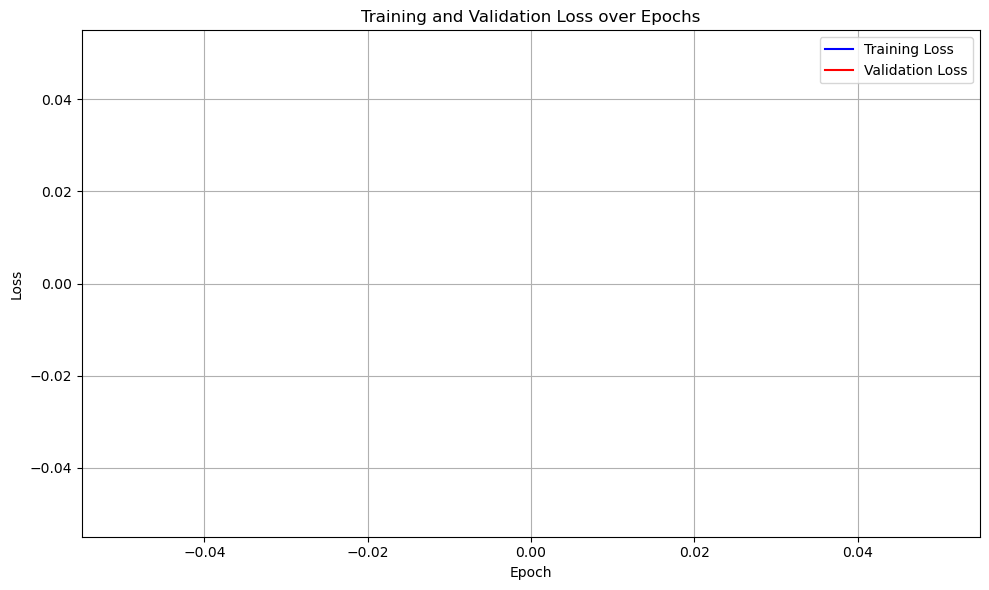

In [139]:
import matplotlib.pyplot as plt

valMetrics = list(enumerate(validationMetrics[0]))
trainMetrics = list(enumerate(trainingMetrics[0]))

# Extract training loss values (converting string values to float)
train_losses = [float(x[1].strip()) for x in trainMetrics]
val_losses = [x[1] for x in valMetrics]

# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, 'b-', label='Training Loss')
plt.plot(range(1, len(val_losses) + 1), val_losses, 'r-', label='Validation Loss')

# Add labels and title
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss over Epochs')
plt.legend()
plt.grid(True)

# Ensure plot is readable
plt.tight_layout()
plt.show()

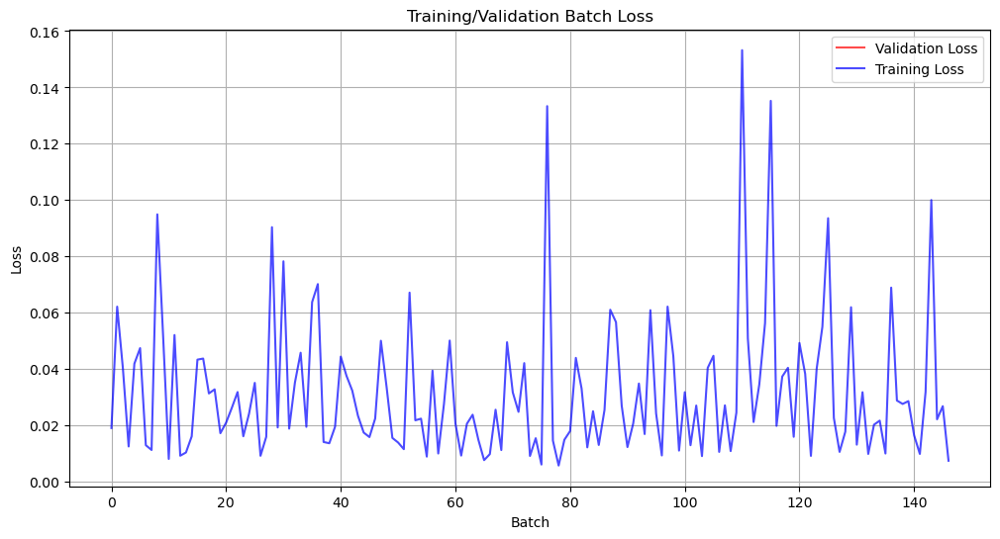

In [140]:
plt.figure(figsize=(12, 6))
plt.plot(range(len(validationMetrics[1])), validationMetrics[1], 'r-', alpha=0.7, label = 'Validation Loss')
plt.plot(range(len(trainingMetrics[1])), trainingMetrics[1], 'b-', alpha=0.7, label = 'Training Loss')
plt.title('Training/Validation Batch Loss')
plt.xlabel('Batch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

In [305]:
# Make sure model is in eval mode for inference
helpNet.eval()
helpNet.to(device)
# Create an example input tensor with the correct shape
example_input = torch.randn(1, 3, 224, 224).to(device)

# Trace the model with the example input
traced_model = torch.jit.trace(helpNet, example_input)

# Save the traced model
traced_model.save('HelpNet_V1_Android.pt')

# Optionally, save model state dictionary separately
torch.save(helpNet.state_dict(), 'helpnet_weights.pth')

print("Model saved successfully for Android deployment")

Model saved successfully for Android deployment


*Testing*

In [147]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

def test_model(model, test_dataset, batch_size=128):
    """
    Test the model on the test dataset and display various metrics and visualizations
    
    Args:
        model: The trained PyTorch model
        test_dataset: The test dataset
        batch_size: Batch size for the test dataloader
    """
    
    # Create test dataloader
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)
    
    # Set model to evaluation mode
    model.eval()
    
    # Lists to store predictions and ground truth
    all_predictions = []
    all_labels = []
    
    # Disable gradient computation
    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc="Testing"):
            # Move data to device
            images = images.to(device)
            
            # Get predictions
            outputs = model(images)
            predicted = torch.sigmoid(outputs)
            predicted = (predicted > 0.75).float().data
            
            # Store predictions and labels
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    # Convert to numpy arrays
    all_predictions = np.array(all_predictions)
    all_labels = np.array(all_labels)
    
    # Calculate and print classification report
    print("\nClassification Report:")
    print(classification_report(all_labels, all_predictions))
    
    # Calculate confusion matrix
    cm = confusion_matrix(all_labels, all_predictions)
    
    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()
    
    # Calculate metrics
    accuracy = accuracy_score(all_labels, all_predictions)
    precision = precision_score(all_labels, all_predictions, average='weighted')
    recall = recall_score(all_labels, all_predictions, average='weighted')
    f1 = f1_score(all_labels, all_predictions, average='weighted')
    
    print("\nOverall Metrics:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    
    return {
        'predictions': all_predictions,
        'labels': all_labels,
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1
    }

Testing: 100%|██████████| 49/49 [00:40<00:00,  1.22it/s]



Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3153
           1       0.99      0.99      0.99      3063

    accuracy                           0.99      6216
   macro avg       0.99      0.99      0.99      6216
weighted avg       0.99      0.99      0.99      6216



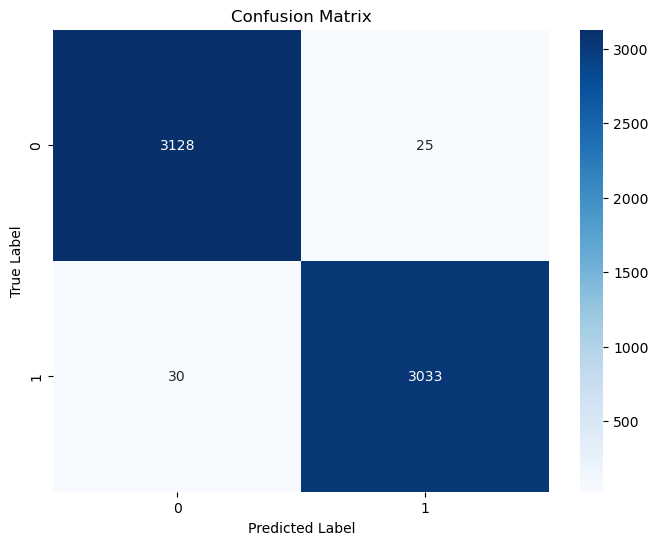


Overall Metrics:
Accuracy: 0.9912
Precision: 0.9912
Recall: 0.9912
F1 Score: 0.9912


{'predictions': array([[0.],
        [0.],
        [0.],
        ...,
        [1.],
        [1.],
        [1.]], dtype=float32),
 'labels': array([0, 0, 0, ..., 1, 1, 1]),
 'accuracy': 0.9911518661518661,
 'precision': 0.9911529314715125,
 'recall': 0.9911518661518661,
 'f1': 0.9911517573529087}

In [146]:
testMetrics:dict[str, any] = test_model(helpNet, testDataset, batch_size = 128)
testMetrics

In [7]:
# Create a new instance of the model
helpNet = HelpNet().to(device)

# Load the saved weights
helpNet.load_state_dict(torch.load('helpnet_weights.pth'))

# Set the model to evaluation mode
helpNet.eval()

print("Model loaded successfully")

Model loaded successfully


/var/folders/q4/0gv08r1113n8lkj4164bmk840000gn/T/ipykernel_33044/4271232842.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  helpNet.load_state_dict(torch.load('helpnet_w

Finalizing everything before moving to android studio

In [284]:
testTrans = Compose([
    Resize(256),
    CenterCrop(224),
    ToTensor(),
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

trainTrans = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [301]:
# Test (Real)

dataset = ImageFolder(root = '/Users/shadyali/HelpNet/tests', transform = testTrans)

iterator = iter(DataLoader(dataset, num_workers = 0, batch_size = 29))

image, label = next(iterator)
image.shape

torch.Size([29, 3, 224, 224])

In [302]:
helpNet.eval()
testModel = helpNet.cpu()
testModel.eval()
with torch.no_grad():
    print(torch.sigmoid(testModel(image)))

tensor([[0.0060],
        [0.9973],
        [0.9941],
        [0.8116],
        [0.9357],
        [0.1086],
        [0.9799],
        [0.0407],
        [0.0022],
        [0.9963],
        [0.9944],
        [0.9974],
        [0.9874],
        [0.9907],
        [0.9912],
        [0.9956],
        [0.9924],
        [0.9923],
        [0.9904],
        [0.9739],
        [0.9970],
        [0.9902],
        [0.9942],
        [0.0673],
        [0.0076],
        [0.9958],
        [0.9945],
        [0.6574],
        [0.1148]])


In [296]:
image = image.to(device)
label = label.to(device)

In [303]:
helpNet.eval()
with torch.no_grad():
    print(torch.sigmoid(helpNet(image))* 100)

tensor([[ 0.5964],
        [99.7308],
        [99.4083],
        [81.1629],
        [93.5718],
        [10.8605],
        [97.9894],
        [ 4.0664],
        [ 0.2226],
        [99.6337],
        [99.4440],
        [99.7391],
        [98.7413],
        [99.0707],
        [99.1211],
        [99.5570],
        [99.2392],
        [99.2344],
        [99.0431],
        [97.3855],
        [99.7009],
        [99.0157],
        [99.4163],
        [ 6.7320],
        [ 0.7648],
        [99.5791],
        [99.4543],
        [65.7412],
        [11.4829]])


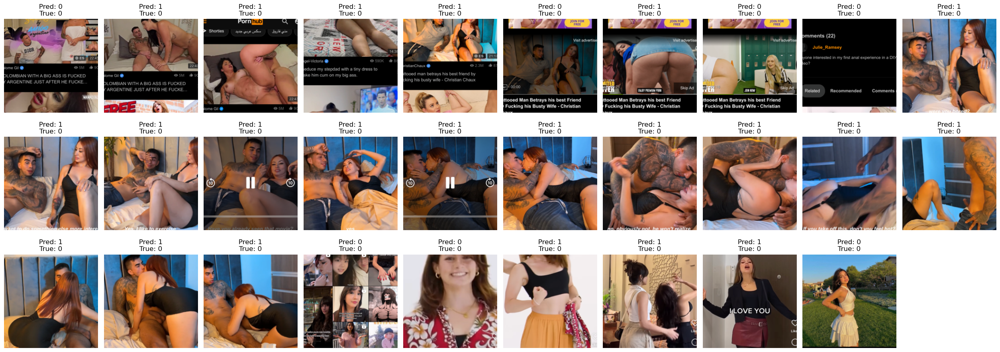

In [300]:
import numpy as np
import matplotlib.pyplot as plt

helpNet.eval()
with torch.no_grad():
    predictions = torch.sigmoid(helpNet(image))

# Create a figure with 5x10 subplots
plt.figure(figsize=(25, 15))

for i in range(min(50, len(image))):
    plt.subplot(5, 10, i+1)
    
    # Get the image tensor and move to CPU
    img = image[i].cpu()
    
    # Denormalize the image
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    img = img * std[:, None, None] + mean[:, None, None]
    
    # Clamp values between 0 and 1
    img = torch.clamp(img, 0, 1)
    
    # Convert to numpy and adjust dimensions for display
    img = img.permute(1, 2, 0).numpy()
    
    plt.imshow(img)
    pred_class = "1" if predictions[i] > 0.6 else "0"
    true_class = str(label[i].item())
    plt.title(f'Pred: {pred_class}\nTrue: {true_class}')
    plt.axis('off')

plt.tight_layout()
plt.show()


In [7]:
# Load the model and move to CPU
helpNet = torch.jit.load('/Users/shadyali/HelpNet/HelpNet_V1_Android.pt', map_location=torch.device('cpu'))

# Set to eval mode
helpNet.eval()

# Create example input on CPU
example_input = torch.randn(1, 3, 224, 224)

# Trace the model
traced_model = torch.jit.trace(helpNet, example_input)

# Save the traced model for CPU deployment
traced_model.save('HelpNet_V1_CPU.pt')

# Save weights separately if needed
torch.save(helpNet.state_dict(), 'helpnet_weights_cpu.pth')

print("Model saved successfully for CPU deployment")

# Verify the model loads and runs on CPU
test_input = torch.randn(1, 3, 224, 224)
with torch.no_grad():
    output = traced_model(test_input)
    print("\nTest prediction shape:", output.shape)
    print("Test prediction:", torch.sigmoid(output))

/Users/shadyali/anaconda3/lib/python3.12/site-packages/torch/jit/_trace.py:687: UserWarning: The input to trace is already a ScriptModule, tracing it is a no-op. Returning the object as is.
  warnings.warn(


Model saved successfully for CPU deployment

Test prediction shape: torch.Size([1, 1])
Test prediction: tensor([[0.0033]])
